In [2]:

import quandl
import pickle
import pandas as pd
import numpy as np

from sklearn import preprocessing, cross_validation, svm, metrics
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor

import matplotlib.pyplot as plt
from matplotlib import style
import time, datetime
import seaborn as sns

style.use('ggplot')
import warnings
warnings.filterwarnings('ignore')

In [3]:
df_all = pd.read_csv('data/bitstampUSD_1-min_data_2012-01-01_to_2018-01-08.csv')
# df = pd.read_html('https://coinmarketcap.com/currencies/bitcoin/historical-data/?start=20171201&end=20180126')
# df = pd.DataFrame(df[0])

In [4]:
df_main = df_all.tail(518400)
#518400

In [5]:
df_main.head()
df_main.set_index(['Timestamp'],inplace=True)

In [6]:
df = df_main[['Open','Close','Volume_(BTC)','Low','High']]
df.rename(columns={'Volume_(BTC)':'Volume'},inplace=True)
# df = df[['Open','Close','Volume','Low','High']]
df.head()

,Open,Close,Volume,Low,High
Timestamp,,,,,
1484265660,807.51,805.77,0.059300,805.77,807.51
1484265720,807.59,807.59,0.112709,807.59,807.59
1484265780,807.59,807.59,0.112709,807.59,807.59
1484265840,807.42,807.42,0.097000,807.42,807.42
1484265900,807.42,807.42,0.035000,807.42,807.42


In [7]:
df.tail()

,Open,Close,Volume,Low,High
Timestamp,,,,,
1515369360,16167.98,16154.60,2.887541,16154.59,16179.65
1515369420,16178.07,16176.43,1.014694,16142.13,16178.07
1515369480,16131.19,16114.30,16.897225,16114.30,16176.10
1515369540,16169.82,16124.02,6.384757,16114.49,16189.43
1515369600,16173.98,16166.78,25.633791,16102.05,16176.96


In [8]:
df['HL_PCT'] = (df['High']-df['Low'])/df['Low']*100
df['PCT_change'] = (df['Close']-df['Open'])/df['Open']*100
df = df[['Close','Volume','PCT_change','HL_PCT']]

In [9]:
# fig = plt.figure()
# fig = plt.figure(figsize=(15,10))
# ax1 = plt.subplot2grid((2,2),(0,0))
# ax1.set_title('Close')
# ax1.set_ylabel('Close')

# ax2 = plt.subplot2grid((2,2),(0,1))
# ax2.set_title('Volume')
# ax2.set_ylabel('Volume')

# ax3 = plt.subplot2grid((2,2),(1,0))
# ax3.set_title('Precent Change')
# ax3.set_ylabel('PCT_change')

# ax4 = plt.subplot2grid((2,2),(1,1))
# ax4.set_title('High to low Percent change')
# ax4.set_ylabel('HL_PCT')

# df['Close'].plot(ax = ax1,color='blue')
# df['Volume'].plot(ax = ax2,color='orange')
# df['PCT_change'].plot(ax = ax3,color='green')
# df['HL_PCT'].plot(ax = ax4,color='black')
# plt.show()

In [11]:
forecast_col = 'Close'
df.fillna(value=-99999, inplace=True)
forecast_out = int(2000)
df['label'] = df[forecast_col].shift(-forecast_out)
#df.head(21)

In [12]:
df.dropna(inplace=True)
X = np.array(df.drop(['label'],1))
X = preprocessing.scale(X)
# X.reshape(-1,1)
y = np.array(df['label']).astype('int')
print(len(X),len(y))
df.head()

(516400, 516400)


,Close,Volume,PCT_change,HL_PCT,label
Timestamp,,,,,
1484265660,805.77,0.059300,-0.215477,0.215943,831.43
1484265720,807.59,0.112709,0.000000,0.000000,831.43
1484265780,807.59,0.112709,0.000000,0.000000,825.72
1484265840,807.42,0.097000,0.000000,0.000000,825.43
1484265900,807.42,0.035000,0.000000,0.000000,825.43


In [13]:
df.tail()

,Close,Volume,PCT_change,HL_PCT,label
Timestamp,,,,,
1515249360,16452.69,1.305856,0.063738,0.130153,16154.60
1515249420,16498.37,4.637586,0.277645,0.277645,16176.43
1515249480,16505.00,6.119746,0.030303,0.060503,16114.30
1515249540,16504.99,5.778373,-0.000061,0.080283,16124.02
1515249600,16504.99,4.423950,0.000000,0.000121,16166.78


In [16]:
# X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=.9)
split = int(.9*len(X))
X_train = X[:split]
X_test = X[split:]
y_train =  y[:split]
y_test = y[split:]

In [17]:
clf = LinearRegression()
# clf = svm.SVR()
clf.fit(X_train,y_train)
clf.score(X_test,y_test)


0.5126268358648833

In [18]:
# clf = LinearRegression()
# clf = svm.SVR()
# m = 0
# index = 0
# for i in range(1):
#     clf = KNeighborsRegressor(n_neighbors=100,weights='distance')
#     # clf = KNeighborsRegressor(n_neighbors=2,weights='uniform')
#     clf.fit(X_train,y_train)
#     score = clf.score(X_test,y_test)
#     m = score
# #     if(score>m):
# #         m = score
# #         index = i
# print('score:',m,'\nn_neighbors:',index)

# print('mean_abs97olute_error',metrics.mean_absolute_error(y_test, y_pred))
# print('mean_squared_error',metrics.mean_squared_error(y_test, y_pred))
# print('mean_squared_error',np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

In [24]:
x_pred = X_test[1000:]
x_act = y_test[1000:]

y_pred  = clf.predict(x_pred)
print(x_act[:5])
print(y_pred[:5])

[11729 11734 11714 11724 11724]
[11349.29891168 11368.59207606 11362.59548983 11366.33419658
 11360.53061844]


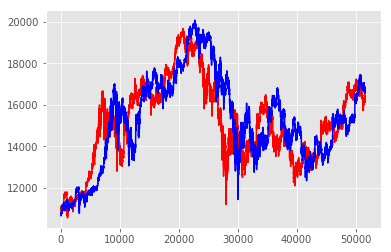

In [26]:
%matplotlib inline
import mpld3
mpld3.enable_notebook()
y_ans = clf.predict(X_test)
plt.plot(y_test,color = 'r')
plt.plot(y_ans,color='blue')
plt.show()

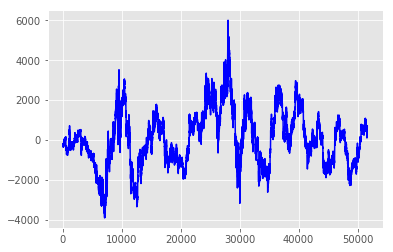

In [27]:
plt.plot(y_ans-y_test,color='blue')
plt.show()

In [19]:
forecast_set = clf.predict(X_lately)
# print(forecast_set[-1])
# df['Forecast'] = np.nan
# last_unix = df.iloc[-1].name
# # print(df_main.head())
# print(df.tail(forecast_out),last_unix,df.iloc[-forecast_out])

# one_min = 60
# next_unix = last_unix + one_min
# for i in forecast_set:
#     next_unix += one_min
#     df.loc[next_unix]= [np.nan for _ in range(len(df.columns)-1)]+[i]

# print(df.tail())

15530.540617963103
(               Close     Volume  PCT_change    HL_PCT     label  Forecast
Timestamp                                                                
1514125500  13490.24   3.913321   -0.062673  0.415590  13999.14       NaN
1514125560  13381.22  40.175090   -0.827695  0.834603  13999.14       NaN
1514125620  13410.00   6.907013    0.215078  0.503712  13999.14       NaN
1514125680  13412.39   1.823667    0.017823  0.092463  14005.00       NaN
1514125740  13472.77   1.631924    0.450181  0.450181  14000.01       NaN
1514125800  13415.81   0.220147   -0.422631  0.425618  14000.00       NaN
1514125860  13520.00   3.988093    0.351155  0.351155  14002.69       NaN
1514125920  13548.31   2.396638    0.209393  0.209393  14049.78       NaN
1514125980  13588.79   8.878893    0.298783  0.366466  13999.14       NaN
1514126040  13539.46  34.088104   -0.363020  0.487586  13985.77       NaN
1514126100  13533.15   7.680899   -0.048450  0.935957  14001.57       NaN
1514126160  13532.

KeyboardInterrupt: 

In [ ]:
%matplotlib inline
import mpld3
mpld3.enable_notebook()
# fig = plt.figure(figsize=(10,8))
df['Adj. Close'].plot(color='orange')
df['Forecast'].plot(color='blue')
plt.legend(loc=4)
plt.xlabel('Date')
plt.ylabel('Price')
plt.show()